### What's the best place to open an Italian restaurant in Toronto

### Table of Contents
#### 1.Introduction
#### 2.Target Audience
#### 3.Data Overview
#### 4.Methodology
#### 5.Discussion
#### 6.Conclusion

### 1. Identifying the Business Problem (Introduction):
Toronto is one of the most densely populated areas in Canada with an estimated population of over 6 million, there is no doubt about the diversity of the population. 

The objective of this project is to determine the best neighbourhood in Toronto for opening an Italian restaurant leveraging Foursquare API. Pizza and Pasta are one of the most bought dishes in Toronto originating from Italy. Toronto is the fourth largest home to Italians with a population of over 500k, there are numerous opportunities to open a new Italian restaurant. Through this project, we will find the most suitable location for an entrepreneur to open a new Italian restaurant in Toronto, Canada.

### 2. Target Audience:
This project is aimed towards entrepreneurs or franchise owners who wish to find the ideal location for opening their Italian restaurant in Toronto.

### 3. Data Overview:
The data that will be required will be a combination of CSV files that have been prepared for the purposes of the analysis from multiple sources which will provide the list of neighbourhoods in Toronto (via Wikipedia), the Geographical location of the neighbourhoods (via Geocoder package) and Venue data pertaining to Italian restaurants (via Foursquare). The Venue data will help find which neighbourhood is best suitable to open an Italian restaurant.

Data will be sourced from
1. WIKI Page - https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M
2. Geocoder Geographical location - https://cocl.us/Geospatial_data
3. Venue data using Foursquare API

### 4. Methodology:

After all the data was collected and put into data frames, cleansing and merging of the data was required to start the process of analysis. When getting the data from Wikipedia, there were Boroughs that were not assigned to any neighbourhood therefore, the following assumptions were made:
1. Only the cells that have an assigned borough will be processed. Borough’s that were not assigned get ignored.
2. More than one neighbourhood can exist in one postal code area.
3. If a cell has a borough but a Not assigned neighbourhood, then the neighbourhood will be the same as the borough.
4. Now after cleansing the data, we created a map using Folium and colour-coded each Neighborhood depending on what Borough it was located in to analyze the data.
5. Next, we used the Foursquare API to get a list of all the Venues in Toronto which included Parks, Schools, Café Shops, Asian Restaurants etc. Getting this data was crucial to analyzing the number of Italian Restaurants all over Toronto. There was a total of 45 Italian Restaurants in Toronto. We then merged the Foursquare Venue data with the Neighborhood data which then gave us the nearest Venue for each of the Neighborhoods.
6. Then to analyze the data we performed a technique in which Categorical Data is transformed into Numerical Data for Machine Learning algorithms. This technique is called One hot encoding. For each of the neighbourhoods, individual venues were turned into the frequency at how many of those Venues were located in each neighbourhood.
7. Then we grouped those rows by Neighborhood and by taking the average of the frequency of occurrence of each Venue Category. A new data frame was then created to store the Neighborhood names as well as the mean frequency of Italian Restaurants in that Neighborhood. This allowed the data to be summarized based on each individual Neighborhood and made the data much simpler to analyze.
8. To make the analysis more interesting, we wanted to cluster the neighbourhoods based on the neighbourhoods that had similar averages of Italian Restaurants in that Neighborhood. To do this we used K-Means clustering. To get our optimum K value that was neither overfitting or underfitting the model, we used the Elbow Point Technique. In this technique, we ran a test with different number of K values and measured the accuracy and then chose the best K value. The best K value is chosen at the point in which the line has the sharpest turn. In our case, we had the Elbow Point at K = 4. That means we will have a total of 4 clusters.
9. After, we merged the venue data with the table above creating a new table which would be the basis for analyzing new opportunities for opening a new Italian Restaurant in Toronto. Then we created a map using the Folium package in Python and each neighbourhood was coloured based on the cluster label.

In [2]:
# import necessary libraries 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
! pip install folium==0.5.0
import folium
import requests
import json
from bs4 import BeautifulSoup
import matplotlib.cm as cm
import matplotlib.colors as colors

%matplotlib inline
print('Packages installed')

     |████████████████████████████████| 79 kB 7.4 MB/s  eta 0:00:01
  Created wheel for folium: filename=folium-0.5.0-py3-none-any.whl size=76240 sha256=e24e52a8c156b6e65c447968e5cacbb1b92489ac839f3242f92c126150d2d045
  Stored in directory: /tmp/wsuser/.cache/pip/wheels/b2/2f/2c/109e446b990d663ea5ce9b078b5e7c1a9c45cca91f377080f8
Successfully built folium
Packages installed


In [9]:
from urllib.request import urlopen
url = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'
html = urlopen(url) 
soup = BeautifulSoup(html, 'html.parser')

In [10]:
table_contents=[]
table=soup.find('table')
for row in table.findAll('td'):
    cell = {}
    if row.span.text=='Not assigned':
        pass
    else:
        cell['PostalCode'] = row.p.text[:3]
        cell['Borough'] = (row.span.text).split('(')[0]
        cell['Neighborhood'] = (((((row.span.text).split('(')[1]).strip(')')).replace(' /',',')).replace(')',' ')).strip(' ')
        table_contents.append(cell)

# print(table_contents)
df=pd.DataFrame(table_contents)
df['Borough']=df['Borough'].replace({'Downtown TorontoStn A PO Boxes25 The Esplanade':'Downtown Toronto Stn A',
                                             'East TorontoBusiness reply mail Processing Centre969 Eastern':'East Toronto Business',
                                             'EtobicokeNorthwest':'Etobicoke Northwest','East YorkEast Toronto':'East York/East Toronto',
                                             'MississaugaCanada Post Gateway Processing Centre':'Mississauga'})

In [11]:
df.head()

,PostalCode,Borough,Neighborhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Queen's Park,Ontario Provincial Government


In [12]:
df_grouped = df.groupby(['Borough', 'PostalCode'], as_index=False).agg(lambda x:','.join(x))
df_grouped.head()

,Borough,PostalCode,Neighborhood
0,Central Toronto,M4N,Lawrence Park
1,Central Toronto,M4P,Davisville North
2,Central Toronto,M4R,North Toronto West
3,Central Toronto,M4S,Davisville
4,Central Toronto,M4T,"Moore Park, Summerhill East"


In [13]:
# Check if we still have any Neighborhoods that are Not Assigned
df_grouped.loc[df_grouped['Borough'].isin(["Not assigned"])]

,Borough,PostalCode,Neighborhood


In [14]:
df = df_grouped
df.shape

(103, 3)

In [15]:
df = df[['PostalCode', 'Borough', 'Neighborhood']]

In [16]:
df.head()

,PostalCode,Borough,Neighborhood
0,M4N,Central Toronto,Lawrence Park
1,M4P,Central Toronto,Davisville North
2,M4R,Central Toronto,North Toronto West
3,M4S,Central Toronto,Davisville
4,M4T,Central Toronto,"Moore Park, Summerhill East"


In [17]:
geo_url = "https://cocl.us/Geospatial_data"

geo_df = pd.read_csv(geo_url)
geo_df.rename(columns={'Postal Code': 'PostalCode'}, inplace=True)
geo_df.head()

,PostalCode,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [18]:
# Merging the Data
df = pd.merge(df, geo_df, on='PostalCode')
df.head()

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M4N,Central Toronto,Lawrence Park,43.728020,-79.388790
1,M4P,Central Toronto,Davisville North,43.712751,-79.390197
2,M4R,Central Toronto,North Toronto West,43.715383,-79.405678
3,M4S,Central Toronto,Davisville,43.704324,-79.388790
4,M4T,Central Toronto,"Moore Park, Summerhill East",43.689574,-79.383160


In [19]:
# lets find out how many neighborhoods in each borough
df.groupby('Borough').count()['Neighborhood']

Borough
Central Toronto            9
Downtown Toronto          17
Downtown Toronto Stn A     1
East Toronto               4
East Toronto Business      1
East York                  4
East York/East Toronto     1
Etobicoke                 11
Etobicoke Northwest        1
Mississauga                1
North York                24
Queen's Park               1
Scarborough               17
West Toronto               6
York                       5
Name: Neighborhood, dtype: int64

In [20]:
df_toronto = df
df_toronto.head()

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M4N,Central Toronto,Lawrence Park,43.728020,-79.388790
1,M4P,Central Toronto,Davisville North,43.712751,-79.390197
2,M4R,Central Toronto,North Toronto West,43.715383,-79.405678
3,M4S,Central Toronto,Davisville,43.704324,-79.388790
4,M4T,Central Toronto,"Moore Park, Summerhill East",43.689574,-79.383160


In [21]:
#Create list with the Boroughs (to be used later)
boroughs = df_toronto['Borough'].unique().tolist()

In [22]:
#Obtain the coordinates from the dataset itself, just averaging Latitude/Longitude of the current dataset 
lat_toronto = df_toronto['Latitude'].mean()
lon_toronto = df_toronto['Longitude'].mean()
print('The geographical coordinates of Toronto are {}, {}'.format(lat_toronto, lon_toronto))

The geographical coordinates of Toronto are 43.704607733980595, -79.3971529116505


In [24]:
# This will color categorize each borough
borough_color = {}
for borough in boroughs:
    borough_color[borough]= '#%02X%02X%02X' % tuple(np.random.choice(range(256), size=3)) #Random color

In [25]:
map_toronto = folium.Map(location=[lat_toronto, lon_toronto], zoom_start=10.5)

# add markers to map
for lat, lng, borough, neighborhood in zip(df_toronto['Latitude'], 
                                           df_toronto['Longitude'],
                                           df_toronto['Borough'], 
                                           df_toronto['Neighborhood']):
    label_text = borough + ' - ' + neighborhood
    label = folium.Popup(label_text)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=borough_color[borough],
        fill_color=borough_color[borough],
        fill_opacity=0.8).add_to(map_toronto)  
    
map_toronto

In [26]:
CLIENT_ID = 'W15G3CCIJ0U4TB3HXRGVFQSUSBO4EHN1KPUDPLL35IPRK0GN' # your Foursquare ID
CLIENT_SECRET = 'B45WAL0DJWMTRPX1QFGHXPDBJXQ2LOYRFNCCZDZUIKE1GR5C' # your Foursquare Secret
ACCESS_TOKEN = 'L0GMV4CEYZVY0RYVA2VQ3GAUYXRIYH1WSLAJXTQGJTFUHV15'
VERSION = '20210330'

print('Credentials Stored')

Credentials Stored


In [58]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    LIMIT = 100 # limit of number of venues returned by Foursquare API
    radius = 500 # define radius
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id=W15G3CCIJ0U4TB3HXRGVFQSUSBO4EHN1KPUDPLL35IPRK0GN&client_secret=B45WAL0DJWMTRPX1QFGHXPDBJXQ2LOYRFNCCZDZUIKE1GR5C&v=20210330&ll=43.704607733980595,-79.3971529116505&radius=500&limit=100'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
        
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [59]:
#Get venues for all neighborhoods in our dataset
toronto_venues = getNearbyVenues(names=df_toronto['Neighborhood'],
                                latitudes=df_toronto['Latitude'],
                                longitudes=df_toronto['Longitude'])

Lawrence Park
Davisville North
North Toronto West
Davisville
Moore Park, Summerhill East
Summerhill West, Rathnelly, South Hill, Forest Hill SE, Deer Park
Roselawn
Forest Hill North & West
The Annex, North Midtown, Yorkville
Rosedale
St. James Town, Cabbagetown
Church and Wellesley
Regent Park, Harbourfront
Garden District, Ryerson
St. James Town
Berczy Park
Central Bay Street
Richmond, Adelaide, King
Harbourfront East, Union Station, Toronto Islands
Toronto Dominion Centre, Design Exchange
Commerce Court, Victoria Hotel
University of Toronto, Harbord
Kensington Market, Chinatown, Grange Park
CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport
First Canadian Place, Underground city
Christie
Enclave of M5E
The Beaches
The Danforth West, Riverdale
India Bazaar, The Beaches West
Studio District
Enclave of M4L
Parkview Hill, Woodbine Gardens
Woodbine Heights
Leaside
Thorncliffe Park
The Danforth  East
New Toronto, Mimico South, Humber 

In [60]:
toronto_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Lawrence Park,43.72802,-79.38879,The Keg Steakhouse + Bar - Yonge + Eglinton,43.705702,-79.397905,Restaurant
1,Lawrence Park,43.72802,-79.38879,Noorden Food x Bar,43.702814,-79.397645,Restaurant
2,Lawrence Park,43.72802,-79.38879,Balsamico,43.701505,-79.397162,Italian Restaurant
3,Lawrence Park,43.72802,-79.38879,Yoga Tree Midtown,43.707642,-79.397472,Yoga Studio
4,Lawrence Park,43.72802,-79.38879,Loblaws,43.707244,-79.394701,Supermarket


In [61]:
toronto_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Agincourt,59,59,59,59,59,59
"Alderwood, Long Branch",59,59,59,59,59,59
"Bathurst Manor, Wilson Heights, Downsview North",59,59,59,59,59,59
Bayview Village,59,59,59,59,59,59
"Bedford Park, Lawrence Manor East",59,59,59,59,59,59
...,...,...,...,...,...,...
"Willowdale, Newtonbrook",59,59,59,59,59,59
Woburn,59,59,59,59,59,59
Woodbine Heights,59,59,59,59,59,59


In [62]:
print('There are {} uniques categories.'.format(len(toronto_venues['Venue Category'].unique())))

There are 40 uniques categories.


In [63]:
print("The Venue Categories are", toronto_venues['Venue Category'].unique())

The Venue Categories are ['Restaurant' 'Italian Restaurant' 'Yoga Studio' 'Supermarket'
 'Ramen Restaurant' 'Plaza' 'Vegetarian / Vegan Restaurant' 'Bookstore'
 'Coffee Shop' 'Indonesian Restaurant' 'Movie Theater' 'Salad Place'
 'Deli / Bodega' 'Café' 'Middle Eastern Restaurant' 'Syrian Restaurant'
 'Taco Place' 'Japanese Restaurant' 'Sushi Restaurant' 'Bakery'
 'Vietnamese Restaurant' 'Bubble Tea Shop' 'Caribbean Restaurant'
 'Arts & Crafts Store' 'Fast Food Restaurant' 'Gaming Cafe'
 'Ice Cream Shop' 'Pub' 'Bar' 'Gym' 'Mexican Restaurant'
 'Furniture / Home Store' 'Buffet' 'Candy Store' 'Pharmacy' 'Bank'
 'Video Game Store' 'Indian Restaurant' 'Clothing Store' 'Comedy Club']


In [64]:
"Italian Restaurant" in toronto_venues['Venue Category'].unique()

True

In [65]:
# one hot encoding
to_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
to_onehot['Neighborhoods'] = toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [to_onehot.columns[-1]] + list(to_onehot.columns[:-1])
to_onehot = to_onehot[fixed_columns]

print(to_onehot.shape)
to_onehot.head()

(6077, 41)


,Neighborhoods,Arts & Crafts Store,Bakery,Bank,Bar,Bookstore,Bubble Tea Shop,Buffet,Café,Candy Store,...,Restaurant,Salad Place,Supermarket,Sushi Restaurant,Syrian Restaurant,Taco Place,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Yoga Studio
0,Lawrence Park,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,Lawrence Park,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,Lawrence Park,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Lawrence Park,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,Lawrence Park,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [66]:
to_grouped = to_onehot.groupby(["Neighborhoods"]).mean().reset_index()

print(to_grouped.shape)
to_grouped.head()

(103, 41)


,Neighborhoods,Arts & Crafts Store,Bakery,Bank,Bar,Bookstore,Bubble Tea Shop,Buffet,Café,Candy Store,...,Restaurant,Salad Place,Supermarket,Sushi Restaurant,Syrian Restaurant,Taco Place,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Yoga Studio
0,Agincourt,0.016949,0.016949,0.016949,0.016949,0.033898,0.016949,0.016949,0.033898,0.016949,...,0.033898,0.016949,0.016949,0.050847,0.016949,0.016949,0.016949,0.016949,0.016949,0.016949
1,"Alderwood, Long Branch",0.016949,0.016949,0.016949,0.016949,0.033898,0.016949,0.016949,0.033898,0.016949,...,0.033898,0.016949,0.016949,0.050847,0.016949,0.016949,0.016949,0.016949,0.016949,0.016949
2,"Bathurst Manor, Wilson Heights, Downsview North",0.016949,0.016949,0.016949,0.016949,0.033898,0.016949,0.016949,0.033898,0.016949,...,0.033898,0.016949,0.016949,0.050847,0.016949,0.016949,0.016949,0.016949,0.016949,0.016949
3,Bayview Village,0.016949,0.016949,0.016949,0.016949,0.033898,0.016949,0.016949,0.033898,0.016949,...,0.033898,0.016949,0.016949,0.050847,0.016949,0.016949,0.016949,0.016949,0.016949,0.016949
4,"Bedford Park, Lawrence Manor East",0.016949,0.016949,0.016949,0.016949,0.033898,0.016949,0.016949,0.033898,0.016949,...,0.033898,0.016949,0.016949,0.050847,0.016949,0.016949,0.016949,0.016949,0.016949,0.016949


In [67]:
ita = to_grouped[["Neighborhoods","Italian Restaurant"]]
ita.head() #.head() shows the first five rows only

,Neighborhoods,Italian Restaurant
0,Agincourt,0.101695
1,"Alderwood, Long Branch",0.101695
2,"Bathurst Manor, Wilson Heights, Downsview North",0.101695
3,Bayview Village,0.101695
4,"Bedford Park, Lawrence Manor East",0.101695


In [68]:
ita = ita.rename(columns={'Neighborhoods':'Neighborhood'})

###Clustering the neighborhoods now

In [69]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=15, random_state=8)
X = ita.drop(['Neighborhood'], axis=1)

In [70]:
kmeans.fit(X)
kmeans.labels_[0:10]

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:1: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  if __name__ == '__main__':


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [71]:
def get_inertia(n_clusters):
    km = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=15, random_state=8)
    km.fit(X)
    return km.inertia_

In [43]:
scores = [get_inertia(x) for x in range(2, 21)]

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:3: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  app.launch_new_instance()
/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:3: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  app.launch_new_instance()
/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:3: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (4). Possibly due to duplicate points in X.
  app.launch_new_instance()
/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:3: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  app.launch_new_instance()
/opt/conda/envs/Python-3.7-main/lib/python3.

Text(0, 0.5, 'Error')

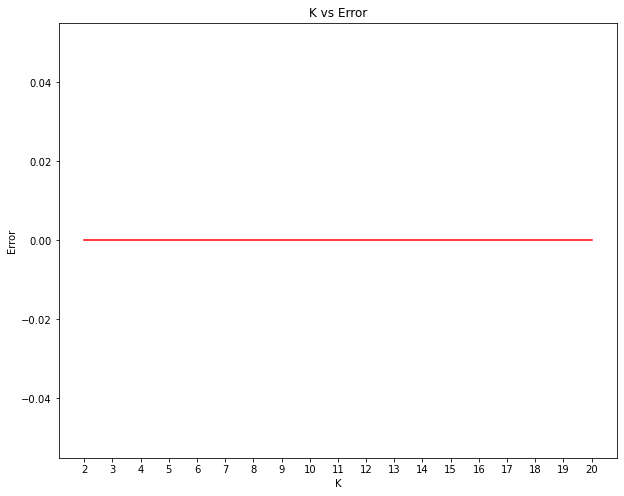

In [72]:
plt.figure(figsize=[10, 8])
sns.lineplot(x=range(2, 21), y=scores, color='r')
plt.title("K vs Error")
plt.xticks(range(2, 21))
plt.xlabel("K")
plt.ylabel("Error")

In [74]:
kclusters = 4

toronto_grouped_clustering = ita.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:6: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (4). Possibly due to duplicate points in X.


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [75]:
# create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.
to_merged = ita.copy()

# add clustering labels
to_merged["Cluster Labels"] = kmeans.labels_

In [76]:
to_merged.head()

,Neighborhood,Italian Restaurant,Cluster Labels
0,Agincourt,0.101695,0
1,"Alderwood, Long Branch",0.101695,0
2,"Bathurst Manor, Wilson Heights, Downsview North",0.101695,0
3,Bayview Village,0.101695,0
4,"Bedford Park, Lawrence Manor East",0.101695,0


In [77]:
# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
to_merged = to_merged.join(toronto_venues.set_index("Neighborhood"), on="Neighborhood")

print(to_merged.shape)
to_merged.head()

(6077, 9)


,Neighborhood,Italian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Agincourt,0.101695,0,43.7942,-79.262029,The Keg Steakhouse + Bar - Yonge + Eglinton,43.705702,-79.397905,Restaurant
0,Agincourt,0.101695,0,43.7942,-79.262029,Noorden Food x Bar,43.702814,-79.397645,Restaurant
0,Agincourt,0.101695,0,43.7942,-79.262029,Balsamico,43.701505,-79.397162,Italian Restaurant
0,Agincourt,0.101695,0,43.7942,-79.262029,Yoga Tree Midtown,43.707642,-79.397472,Yoga Studio
0,Agincourt,0.101695,0,43.7942,-79.262029,Loblaws,43.707244,-79.394701,Supermarket


In [78]:
# sort the results by Cluster Labels
print(to_merged.shape)
to_merged.sort_values(["Cluster Labels"], inplace=True)
to_merged

(6077, 9)


,Neighborhood,Italian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Agincourt,0.101695,0,43.794200,-79.262029,The Keg Steakhouse + Bar - Yonge + Eglinton,43.705702,-79.397905,Restaurant
68,"Regent Park, Harbourfront",0.101695,0,43.654260,-79.360636,Chipotle Mexican Grill,43.708152,-79.398278,Mexican Restaurant
68,"Regent Park, Harbourfront",0.101695,0,43.654260,-79.360636,GoodLife Fitness Toronto Dunfield and Eglinton,43.707645,-79.395303,Gym
68,"Regent Park, Harbourfront",0.101695,0,43.654260,-79.360636,Starbucks,43.707747,-79.398556,Coffee Shop
68,"Regent Park, Harbourfront",0.101695,0,43.654260,-79.360636,St. Louis Bar & Grill,43.701561,-79.397558,Bar
...,...,...,...,...,...,...,...,...,...
34,"First Canadian Place, Underground city",0.101695,0,43.648429,-79.382280,Fit for Life,43.707304,-79.396901,Salad Place
34,"First Canadian Place, Underground city",0.101695,0,43.648429,-79.382280,Cineplex VIP Yonge & Eglinton,43.706515,-79.398950,Movie Theater
34,"First Canadian Place, Underground city",0.101695,0,43.648429,-79.382280,BMV Books,43.707450,-79.398457,Bookstore
34,"First Canadian Place, Underground city",0.101695,0,43.648429,-79.382280,Rolltation,43.707517,-79.398456,Japanese Restaurant


In [79]:
to_merged['Venue Category'].value_counts()['Italian Restaurant']

618

In [80]:
# create map
map_clusters = folium.Map(location=[lat_toronto, lon_toronto], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(to_merged['Neighborhood Latitude'], to_merged['Neighborhood Longitude'], to_merged['Neighborhood'], to_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' - Cluster ' + str(cluster))
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill_color=rainbow[cluster-1],
        fill_opacity=0.8).add_to(map_clusters)
       
map_clusters

In [81]:
ita["Cluster Labels"] = kmeans.labels_
ita.head()

,Neighborhood,Italian Restaurant,Cluster Labels
0,Agincourt,0.101695,0
1,"Alderwood, Long Branch",0.101695,0
2,"Bathurst Manor, Wilson Heights, Downsview North",0.101695,0
3,Bayview Village,0.101695,0
4,"Bedford Park, Lawrence Manor East",0.101695,0


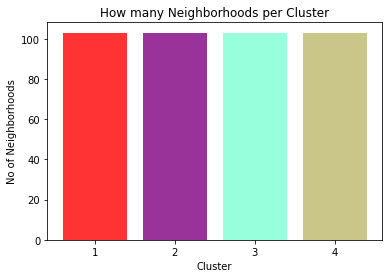

In [82]:
objects = (1,2,3,4)
y_pos = np.arange(len(objects))
performance = ita['Cluster Labels'].value_counts().to_frame().sort_index(ascending=True)
perf = performance['Cluster Labels'].tolist()
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'purple','aquamarine', 'darkkhaki'])
plt.xticks(y_pos, objects)
plt.ylabel('No of Neighborhoods')
plt.xlabel('Cluster')
plt.title('How many Neighborhoods per Cluster')

plt.show()

In [83]:
# How many neighborhoods in each cluster
ita['Cluster Labels'].value_counts()

0    103
Name: Cluster Labels, dtype: int64

In [84]:
# This will create a dataframe with borough of each neighborhood which we will merge with each cluster dataframe
df_new = df[['Borough', 'Neighborhood']]
df_new.head()

,Borough,Neighborhood
0,Central Toronto,Lawrence Park
1,Central Toronto,Davisville North
2,Central Toronto,North Toronto West
3,Central Toronto,Davisville
4,Central Toronto,"Moore Park, Summerhill East"


In [85]:
# Red 

cluster1 = to_merged.loc[to_merged['Cluster Labels'] == 0]
df_cluster1 = pd.merge(df_new, cluster1, on='Neighborhood')
df_cluster1

,Borough,Neighborhood,Italian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Central Toronto,Lawrence Park,0.101695,0,43.728020,-79.388790,Sushi Supreme,43.700563,-79.397118,Sushi Restaurant
1,Central Toronto,Lawrence Park,0.101695,0,43.728020,-79.388790,Fox & Firkin,43.706946,-79.396580,Pub
2,Central Toronto,Lawrence Park,0.101695,0,43.728020,-79.388790,Gelato Simply Italian,43.702080,-79.397475,Ice Cream Shop
3,Central Toronto,Lawrence Park,0.101695,0,43.728020,-79.388790,Echo Sushi,43.701276,-79.397192,Sushi Restaurant
4,Central Toronto,Lawrence Park,0.101695,0,43.728020,-79.388790,Snakes & Lattes,43.706879,-79.396646,Gaming Cafe
...,...,...,...,...,...,...,...,...,...,...
6072,York,Weston,0.101695,0,43.706876,-79.518188,The Keg Steakhouse + Bar - Yonge + Eglinton,43.705702,-79.397905,Restaurant
6073,York,Weston,0.101695,0,43.706876,-79.518188,Urban Outfitters,43.707945,-79.398767,Clothing Store
6074,York,Weston,0.101695,0,43.706876,-79.518188,Absolute Comedy,43.708519,-79.398700,Comedy Club
6075,York,Weston,0.101695,0,43.706876,-79.518188,The Rose and Crown,43.708539,-79.398675,Pub


In [86]:
# Purple 
cluster2=to_merged.loc[to_merged['Cluster Labels'] == 1]
df_cluster2 = pd.merge(df_new, cluster2, on='Neighborhood')

In [87]:
df_cluster2.sort_values(["Italian Restaurant"], ascending=False)

,Borough,Neighborhood,Italian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category


In [89]:
# Blue
cluster3 = to_merged.loc[to_merged['Cluster Labels'] == 2]
df_cluster3 = pd.merge(df_new, cluster3, on='Neighborhood')
df_cluster3

,Borough,Neighborhood,Italian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category


In [90]:
# Turquoise
cluster4 = to_merged.loc[to_merged['Cluster Labels'] == 3]
df_cluster4 = pd.merge(df_new, cluster4, on='Neighborhood')
df_cluster4

,Borough,Neighborhood,Italian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category


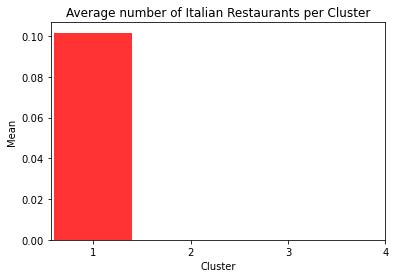

In [91]:
clusters_mean = [df_cluster1['Italian Restaurant'].mean(),df_cluster2['Italian Restaurant'].mean(),df_cluster3['Italian Restaurant'].mean(),
                 df_cluster4['Italian Restaurant'].mean()]
objects = (1,2,3,4)
y_pos = np.arange(len(objects))
perf = clusters_mean
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'purple','aquamarine', 'darkkhaki'])
plt.xticks(y_pos, objects)
plt.ylabel('Mean')
plt.xlabel('Cluster')
plt.title('Average number of Italian Restaurants per Cluster')

plt.show()

##Observations

Most of the Italian Restaurants are in cluster 1 represented by the red clusters. The Neighborhoods located in the North York area that have the highest average of Italian Restaurants are Bedford Park and Lawrence Manor East. Even though there is a huge amount of Neighborhoods in cluster 2, there is little to no Italian Restaurant. We see that in the Downtown Toronto area (cluster 3) has the second last average of Italian Restaurants. Looking at the nearby venues, the optimum place to put a new Italian Restaurant is in Downtown Toronto as their are many Neighborhoods in the area but little to no Italian Restaurants therefore, eliminating any competition. This concludes the optimal findings for this project and recommends the entrepreneur to open an authentic Italian restaurant in these locations with little to no competition. Nonetheless, if the food is authentic, affordable and good taste, I am confident that it will have great following everywhere.